In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error as mape,mean_absolute_error as mae
from keras import optimizers

# Prepare Data

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [4]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [5]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [6]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [9]:
def compare_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [10]:
def error(error1,error2,error3,error4):
    error = pd.DataFrame(columns=['MSE', 'RMSE', 'MAE', 'MAPE'])
    error = [{'MSE' : error1,'RMSE':error2,'MAE':error3,'MAPE':error4}]
    
    return error

# Train/Test Model

In [11]:
train = cloud_cover[cloud_cover['DateTime'] < '2021-12-16 00:00:00']
test = cloud_cover[cloud_cover['DateTime'] >= '2021-12-16 00:00:00']

train = train.set_index('DateTime')
test = test.set_index('DateTime')

X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,25)

X_train Shape : (14743, 25, 1)
y_train Shape : (14743, 1)
X_test Shape :  (293, 25, 1)
y_test Shape :  (293, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [12]:
train

,cloud_cover
DateTime,
2021-11-16 11:15:00,0.990000
2021-11-16 11:16:00,0.989000
2021-11-16 11:17:00,0.987667
2021-11-16 11:18:00,0.987000
2021-11-16 11:19:00,0.987000
...,...
2021-12-15 16:55:00,0.321000
2021-12-15 16:56:00,0.304000
2021-12-15 16:57:00,0.286000


In [13]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [14]:
test1 = test.copy()

In [27]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 10s 13ms/step - loss: 0.0062 - val_loss: 0.0048
Epoch 2/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0023 - val_loss: 0.0037
Epoch 3/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0019 - val_loss: 0.0031
Epoch 4/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 5/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 6/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 7/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 8/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 9/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 10/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0012 - val_l

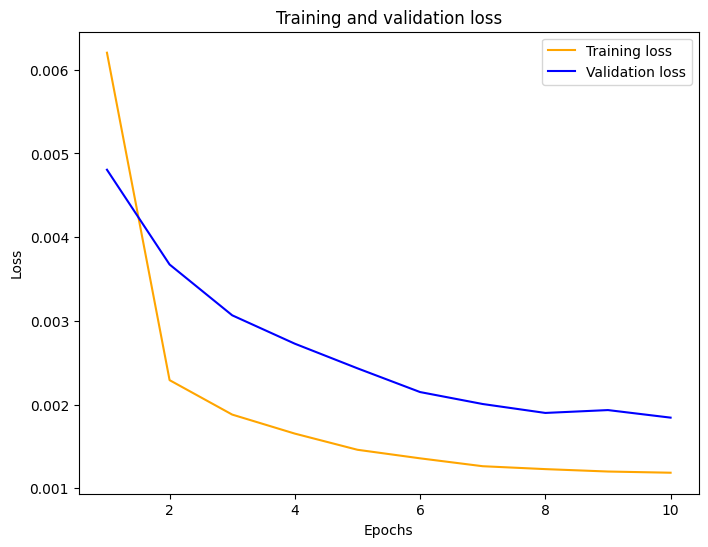

In [28]:
plot_curve(hist_adam)

In [29]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

10/10 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-16 09:10:00,0.111,0.324725,0.331266
1,2021-12-16 09:11:00,0.112,0.145903,0.126472
2,2021-12-16 09:12:00,0.116,0.120067,0.110025
3,2021-12-16 09:13:00,0.112,0.119231,0.115425
4,2021-12-16 09:14:00,0.099,0.115862,0.114308
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.166643,0.169455
289,2021-12-16 13:59:00,0.169,0.166334,0.169263
290,2021-12-16 14:00:00,0.147,0.167044,0.170180
291,2021-12-16 14:01:00,0.145,0.149797,0.149873


In [30]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [31]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_rmse_error = mean_squared_error(test1["cloud_cover"], test1["LSTM_adam"], squared=False)
lstm_mae_error = mae(test1["cloud_cover"], test1["LSTM_adam"])
lstm_mape_error = mape(test1['cloud_cover'], test1['LSTM_adam'])
error(lstm_mse_error_unit_50_adam,lstm_rmse_error,lstm_mae_error,lstm_mape_error)


[{'MSE': 0.001834922346168599,
  'RMSE': 0.04283599358213369,
  'MAE': 0.012477852825418674,
  'MAPE': 0.05620366907776528}]

In [133]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'Frist layer', 'Drop out', 'Second layer', 'Drop out2', 'Third layer', 
                                 'Output layer', 'Epochs', 'MAE error', 'MAPE error','MSE error', 'RMSE error'])

data = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error, 'MAPE error' : lstm_mape_error,'MSE error':lstm_mse_error_unit_50_adam, 'RMSE error':lstm_rmse_error} ]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\1239629580.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [33]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 9s 12ms/step - loss: 0.0054 - val_loss: 0.0030
Epoch 2/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0017 - val_loss: 0.0022
Epoch 3/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 4/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 5/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 6/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 7/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 8/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 9/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 10/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - val_lo

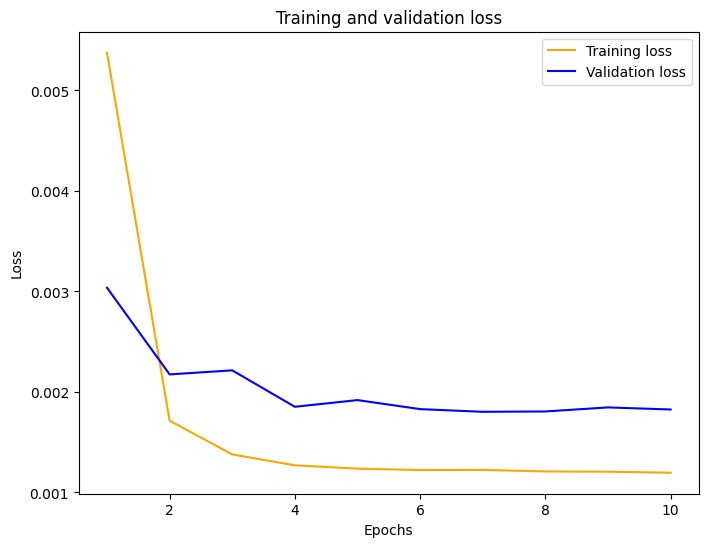

In [34]:
plot_curve(hist_50_rms)

In [35]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-16 09:10:00,0.111,0.324725,0.322596
1,2021-12-16 09:11:00,0.112,0.145903,0.125559
2,2021-12-16 09:12:00,0.116,0.120067,0.113365
3,2021-12-16 09:13:00,0.112,0.119231,0.116684
4,2021-12-16 09:14:00,0.099,0.115862,0.114148
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.166643,0.165007
289,2021-12-16 13:59:00,0.169,0.166334,0.164843
290,2021-12-16 14:00:00,0.147,0.167044,0.165704
291,2021-12-16 14:01:00,0.145,0.149797,0.145769


In [36]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [37]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
lstm_rmse_error1 = mean_squared_error(test1["cloud_cover"], test1["LSTM_50_rms"], squared=False)
lstm_mae_error1 = mae(test1["cloud_cover"], test1["LSTM_50_rms"])
lstm_mape_error1 = mape(test1['cloud_cover'], test1['LSTM_50_rms'])
error(lstm_mse_error_unit_50_rms,lstm_rmse_error1,lstm_mae_error1,lstm_mape_error1)

[{'MSE': 0.0018158542549349573,
  'RMSE': 0.0426128414323072,
  'MAE': 0.012514341309819207,
  'MAPE': 0.05693868870461317}]

In [38]:
compare_model(lstm_mape_error,lstm_mape_error1)

Better MSE value is :  0.05620366907776528


,Model,MSE error
0,model,0.056204
1,model_1,0.056939


In [134]:
data1 = [{'Lags':25 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error1, 'MAPE error' : lstm_mape_error1,'MSE error':lstm_mse_error_unit_50_rms, 'RMSE error':lstm_rmse_error1}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\3715862764.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,,50,,,,,1,10,0.012514,0.056939,0.001816,0.042613


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [40]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
231/231 [==============================] - 7s 19ms/step - loss: 0.0088 - val_loss: 0.0061
Epoch 2/10
231/231 [==============================] - 4s 16ms/step - loss: 0.0029 - val_loss: 0.0048
Epoch 3/10
231/231 [==============================] - 5s 23ms/step - loss: 0.0024 - val_loss: 0.0038
Epoch 4/10
231/231 [==============================] - 5s 21ms/step - loss: 0.0020 - val_loss: 0.0035
Epoch 5/10
231/231 [==============================] - 5s 22ms/step - loss: 0.0018 - val_loss: 0.0031
Epoch 6/10
231/231 [==============================] - 4s 19ms/step - loss: 0.0017 - val_loss: 0.0026
Epoch 7/10
231/231 [==============================] - 4s 18ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 8/10
231/231 [==============================] - 5s 20ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 9/10
231/231 [==============================] - 6s 27ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 10/10
231/231 [==============================] - 5s 22ms/step - loss: 0.0013 - val_lo

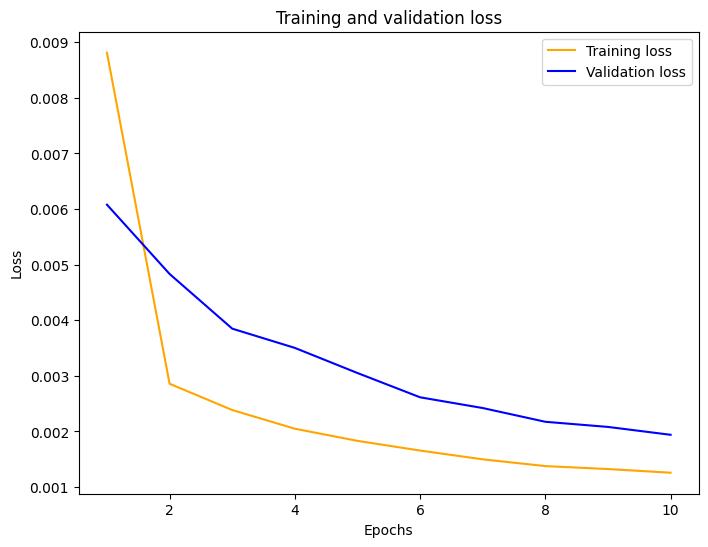

In [41]:
plot_curve(hist_batch_size64)

In [42]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-16 09:10:00,0.111,0.324725,0.322596,0.325931
1,2021-12-16 09:11:00,0.112,0.145903,0.125559,0.171917
2,2021-12-16 09:12:00,0.116,0.120067,0.113365,0.116375
3,2021-12-16 09:13:00,0.112,0.119231,0.116684,0.113617
4,2021-12-16 09:14:00,0.099,0.115862,0.114148,0.116795
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.166643,0.165007,0.167148
289,2021-12-16 13:59:00,0.169,0.166334,0.164843,0.166575
290,2021-12-16 14:00:00,0.147,0.167044,0.165704,0.167026
291,2021-12-16 14:01:00,0.145,0.149797,0.145769,0.152683


In [43]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [44]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
lstm_rmse_error2 = mean_squared_error(test1["cloud_cover"], test1["LSTM_4_batch_size"], squared=False)
lstm_mae_error2 = mae(test1["cloud_cover"], test1["LSTM_4_batch_size"])
lstm_mape_error2 = mape(test1['cloud_cover'], test1['LSTM_4_batch_size'])
error(lstm_mse_error_batch_size64,lstm_rmse_error2,lstm_mae_error2,lstm_mape_error2)

[{'MSE': 0.0019295419203972555,
  'RMSE': 0.0439265514284613,
  'MAE': 0.013487324807017328,
  'MAPE': 0.06022145540104964}]

In [45]:
compare_model(lstm_mape_error,lstm_mape_error2)

Better MSE value is :  0.05620366907776528


,Model,MSE error
0,model,0.056204
1,model_1,0.060221


In [135]:
data2 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error2, 'MAPE error' : lstm_mape_error2,'MSE error':lstm_mse_error_batch_size64
              , 'RMSE error':lstm_rmse_error2}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\2892691132.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,,50,,,,,1,10,0.012514,0.056939,0.001816,0.042613
2,25,Adam,64,,50,,,,,1,10,0.013487,0.060221,0.001930,0.043927


---

### learning rate 0.1

In [47]:
test2 = test.copy()

#### Add frist layer: units = 50

In [48]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 12s 15ms/step - loss: 0.1339 - val_loss: 0.0027
Epoch 2/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0024 - val_loss: 0.0036
Epoch 3/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0027 - val_loss: 0.0020
Epoch 4/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0029 - val_loss: 0.0033
Epoch 5/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0042 - val_loss: 0.0019
Epoch 6/10
461/461 [==============================] - 6s 14ms/step - loss: 0.0041 - val_loss: 0.0019
Epoch 7/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0037 - val_loss: 0.0034
Epoch 8/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0043 - val_loss: 0.0021
Epoch 9/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0043 - val_loss: 0.0021
Epoch 10/10
461/461 [==============================] - 6s 14ms/step - loss: 0.0050 - val_l

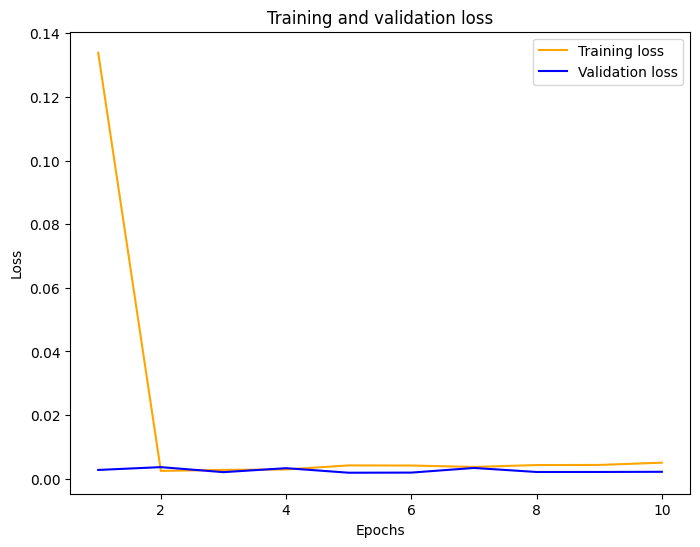

In [49]:
plot_curve(hist_01)

In [50]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-16 09:10:00,0.111,0.333557
1,2021-12-16 09:11:00,0.112,0.114603
2,2021-12-16 09:12:00,0.116,0.127345
3,2021-12-16 09:13:00,0.112,0.140324
4,2021-12-16 09:14:00,0.099,0.133392
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.182674
289,2021-12-16 13:59:00,0.169,0.183034
290,2021-12-16 14:00:00,0.147,0.184626
291,2021-12-16 14:01:00,0.145,0.159706


In [51]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [52]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
lstm_rmse_error3 = mean_squared_error(test2["cloud_cover"], test2["LSTM_01"], squared=False)
lstm_mae_error3 = mae(test2["cloud_cover"], test2["LSTM_01"])
lstm_mape_error3 = mape(test2['cloud_cover'], test2['LSTM_01'])
error(lstm_mse_error_unit_50_01,lstm_rmse_error3,lstm_mae_error3,lstm_mape_error3)

[{'MSE': 0.0021362336025961123,
  'RMSE': 0.046219407207320526,
  'MAE': 0.020205818607131776,
  'MAPE': 0.1139821899818144}]

In [53]:
compare_model(lstm_mape_error,lstm_mape_error3)

Better MSE value is :  0.05620366907776528


,Model,MSE error
0,model,0.056204
1,model_1,0.113982


In [136]:
data3 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error3, 'MAPE error' : lstm_mape_error3,'MSE error':lstm_mse_error_unit_50_01, 'RMSE error':lstm_rmse_error3}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\3785684052.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,,50,,,,,1,10,0.012514,0.056939,0.001816,0.042613
2,25,Adam,64,,50,,,,,1,10,0.013487,0.060221,0.001930,0.043927
3,25,Adam,32,0.1,50,,,,,1,10,0.020206,0.113982,0.002136,0.046219


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [55]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 13s 19ms/step - loss: 0.0591 - val_loss: 0.0021
Epoch 2/10
461/461 [==============================] - 9s 20ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 3/10
461/461 [==============================] - 8s 18ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 4/10
461/461 [==============================] - 7s 15ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 5/10
461/461 [==============================] - 6s 14ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 6/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 7/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 8/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0013 - val_loss: 0.0018
Epoch 9/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 10/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0013 - val_l

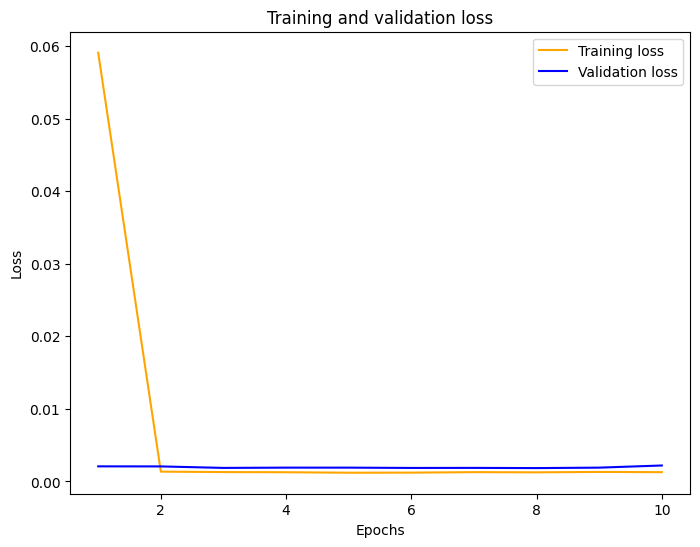

In [56]:
plot_curve(hist_005)

In [57]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

10/10 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-16 09:10:00,0.111,0.333557,0.343299
1,2021-12-16 09:11:00,0.112,0.114603,0.174972
2,2021-12-16 09:12:00,0.116,0.127345,0.136643
3,2021-12-16 09:13:00,0.112,0.140324,0.132198
4,2021-12-16 09:14:00,0.099,0.133392,0.135604
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.182674,0.184739
289,2021-12-16 13:59:00,0.169,0.183034,0.184345
290,2021-12-16 14:00:00,0.147,0.184626,0.185245
291,2021-12-16 14:01:00,0.145,0.159706,0.168100


In [58]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [59]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
lstm_rmse_error4 = mean_squared_error(test2["cloud_cover"], test2["LSTM_005"], squared=False)
lstm_mae_error4 = mae(test2["cloud_cover"], test2["LSTM_005"])
lstm_mape_error4 = mape(test2['cloud_cover'], test2['LSTM_005'])

error(lstm_mse_error_unit_50_005,lstm_rmse_error4,lstm_mae_error4,lstm_mape_error4)

[{'MSE': 0.0021896465190177914,
  'RMSE': 0.04679365896163487,
  'MAE': 0.020667710721899626,
  'MAPE': 0.11466568980948495}]

In [60]:
compare_model(lstm_mape_error,lstm_mape_error4)

Better MSE value is :  0.05620366907776528


,Model,MSE error
0,model,0.056204
1,model_1,0.114666


In [137]:
data4 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error4, 'MAPE error' : lstm_mape_error4,'MSE error':lstm_mse_error_unit_50_005, 'RMSE error':lstm_rmse_error4}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\1660212170.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,,50,,,,,1,10,0.012514,0.056939,0.001816,0.042613
2,25,Adam,64,,50,,,,,1,10,0.013487,0.060221,0.001930,0.043927
3,25,Adam,32,0.1,50,,,,,1,10,0.020206,0.113982,0.002136,0.046219
4,25,Adam,32,0.05,50,,,,,1,10,0.020668,0.114666,0.002190,0.046794


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [62]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 10s 14ms/step - loss: 0.0035 - val_loss: 0.0025
Epoch 2/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0014 - val_loss: 0.0020
Epoch 3/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 4/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 5/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 6/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0013 - val_loss: 0.0025
Epoch 7/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0013 - val_loss: 0.0028
Epoch 8/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 9/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 10/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0012 - val_l

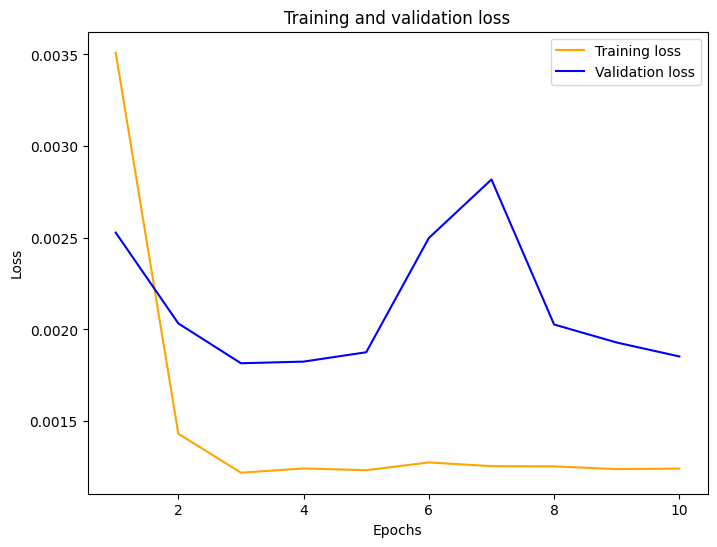

In [63]:
plot_curve(hist_001)

In [64]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-16 09:10:00,0.111,0.333557,0.343299,0.324348
1,2021-12-16 09:11:00,0.112,0.114603,0.174972,0.117793
2,2021-12-16 09:12:00,0.116,0.127345,0.136643,0.097536
3,2021-12-16 09:13:00,0.112,0.140324,0.132198,0.108714
4,2021-12-16 09:14:00,0.099,0.133392,0.135604,0.108465
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.182674,0.184739,0.163013
289,2021-12-16 13:59:00,0.169,0.183034,0.184345,0.162812
290,2021-12-16 14:00:00,0.147,0.184626,0.185245,0.163791
291,2021-12-16 14:01:00,0.145,0.159706,0.168100,0.142898


In [65]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [66]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
lstm_rmse_error5 = mean_squared_error(test2["cloud_cover"], test2["LSTM_001"], squared=False)
lstm_mae_error5 = mae(test2["cloud_cover"], test2["LSTM_001"])
lstm_mape_error5 = mape(test2['cloud_cover'], test2['LSTM_001'])
error(lstm_mse_error_001,lstm_rmse_error5,lstm_mae_error5,lstm_mape_error5)

[{'MSE': 0.0018432513467240748,
  'RMSE': 0.04293310315740145,
  'MAE': 0.012911146313257186,
  'MAPE': 0.062050941516482945}]

In [67]:
compare_model(lstm_mape_error,lstm_mape_error5)

Better MSE value is :  0.05620366907776528


,Model,MSE error
0,model,0.056204
1,model_1,0.062051


In [138]:
data5 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error5, 'MAPE error' : lstm_mape_error5,'MSE error':lstm_mse_error_001, 'RMSE error':lstm_rmse_error5}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\2428393736.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,,50,,,,,1,10,0.012514,0.056939,0.001816,0.042613
2,25,Adam,64,,50,,,,,1,10,0.013487,0.060221,0.001930,0.043927
3,25,Adam,32,0.1,50,,,,,1,10,0.020206,0.113982,0.002136,0.046219
4,25,Adam,32,0.05,50,,,,,1,10,0.020668,0.114666,0.002190,0.046794
5,25,Adam,32,0.01,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [69]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 11s 14ms/step - loss: 0.0052 - val_loss: 0.0033
Epoch 2/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0017 - val_loss: 0.0024
Epoch 3/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0014 - val_loss: 0.0020
Epoch 4/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 5/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 6/10
461/461 [==============================] - 6s 14ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 7/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 8/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 9/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 10/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0012 - val_l

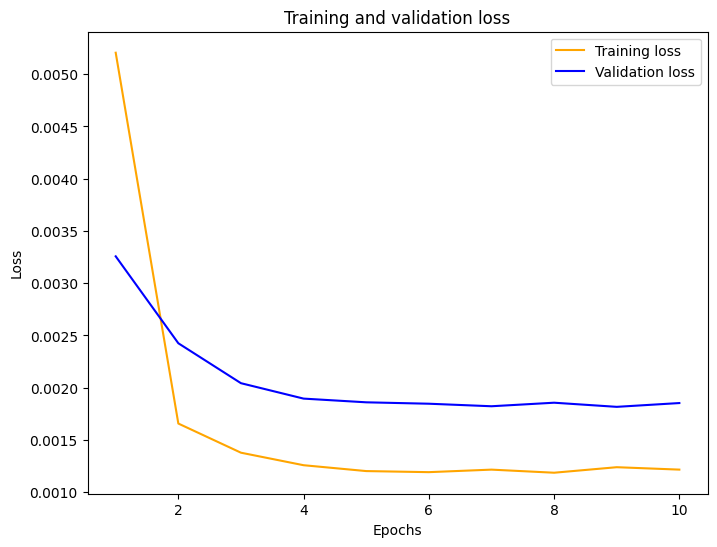

In [70]:
plot_curve(hist_0005)

In [71]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-16 09:10:00,0.111,0.333557,0.343299,0.324348,0.322000
1,2021-12-16 09:11:00,0.112,0.114603,0.174972,0.117793,0.118998
2,2021-12-16 09:12:00,0.116,0.127345,0.136643,0.097536,0.107151
3,2021-12-16 09:13:00,0.112,0.140324,0.132198,0.108714,0.110625
4,2021-12-16 09:14:00,0.099,0.133392,0.135604,0.108465,0.107472
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.182674,0.184739,0.163013,0.162151
289,2021-12-16 13:59:00,0.169,0.183034,0.184345,0.162812,0.162027
290,2021-12-16 14:00:00,0.147,0.184626,0.185245,0.163791,0.162944
291,2021-12-16 14:01:00,0.145,0.159706,0.168100,0.142898,0.142500


In [72]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [73]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
lstm_rmse_error6 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0005"], squared=False)
lstm_mae_error6 = mae(test2["cloud_cover"], test2["LSTM_0005"])
lstm_mape_error6 = mape(test2['cloud_cover'], test2['LSTM_0005'])
error(lstm_mse_error_unit_50_0005,lstm_rmse_error6,lstm_mae_error6,lstm_mape_error6)

[{'MSE': 0.0018435437660555046,
  'RMSE': 0.042936508545240434,
  'MAE': 0.013141182699707998,
  'MAPE': 0.06406429154818044}]

In [74]:
compare_model(lstm_mape_error,lstm_mape_error6)

Better MSE value is :  0.05620366907776528


,Model,MSE error
0,model,0.056204
1,model_1,0.064064


In [139]:
data5 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error6, 'MAPE error' : lstm_mape_error6,'MSE error':lstm_mse_error_unit_50_0005, 'RMSE error':lstm_rmse_error6}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\662684776.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,,50,,,,,1,10,0.012514,0.056939,0.001816,0.042613
2,25,Adam,64,,50,,,,,1,10,0.013487,0.060221,0.001930,0.043927
3,25,Adam,32,0.1,50,,,,,1,10,0.020206,0.113982,0.002136,0.046219
4,25,Adam,32,0.05,50,,,,,1,10,0.020668,0.114666,0.002190,0.046794
5,25,Adam,32,0.01,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933
6,25,Adam,32,0.005,50,,,,,1,10,0.013141,0.064064,0.001844,0.042937


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [76]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 13s 16ms/step - loss: 0.0055 - val_loss: 0.0040
Epoch 2/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0020 - val_loss: 0.0030
Epoch 3/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 4/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 5/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 6/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 7/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 8/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 9/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 10/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0012 - val_l

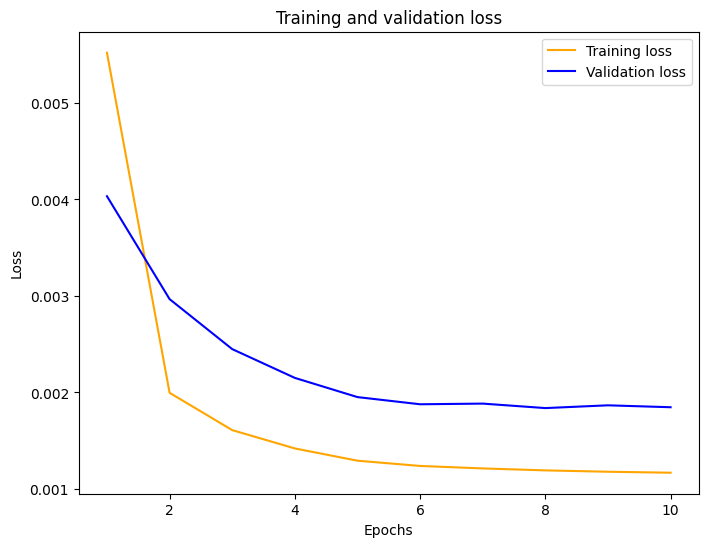

In [77]:
plot_curve(hist_0001)

In [78]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

10/10 [==============================] - 0s 6ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.333557,0.343299,0.324348,0.322000,0.324348
1,2021-12-16 09:11:00,0.112,0.114603,0.174972,0.117793,0.118998,0.117793
2,2021-12-16 09:12:00,0.116,0.127345,0.136643,0.097536,0.107151,0.097536
3,2021-12-16 09:13:00,0.112,0.140324,0.132198,0.108714,0.110625,0.108714
4,2021-12-16 09:14:00,0.099,0.133392,0.135604,0.108465,0.107472,0.108465
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.182674,0.184739,0.163013,0.162151,0.163013
289,2021-12-16 13:59:00,0.169,0.183034,0.184345,0.162812,0.162027,0.162812
290,2021-12-16 14:00:00,0.147,0.184626,0.185245,0.163791,0.162944,0.163791
291,2021-12-16 14:01:00,0.145,0.159706,0.168100,0.142898,0.142500,0.142898


In [79]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [80]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
lstm_rmse_error7 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0001"], squared=False)
lstm_mae_error7 = mae(test2["cloud_cover"], test2["LSTM_0001"])
lstm_mape_error7 = mape(test2['cloud_cover'], test2['LSTM_0001'])
error(lstm_mse_error_0001,lstm_rmse_error7,lstm_mae_error7,lstm_mape_error7)


[{'MSE': 0.0018432513467240748,
  'RMSE': 0.04293310315740145,
  'MAE': 0.012911146313257186,
  'MAPE': 0.062050941516482945}]

In [81]:
compare_model(lstm_mape_error,lstm_mape_error7)

Better MSE value is :  0.05620366907776528


,Model,MSE error
0,model,0.056204
1,model_1,0.062051


In [140]:
data6 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error7, 'MAPE error' : lstm_mape_error7,'MSE error':lstm_mse_error_0001, 'RMSE error':lstm_rmse_error7}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\619738133.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,,50,,,,,1,10,0.012514,0.056939,0.001816,0.042613
2,25,Adam,64,,50,,,,,1,10,0.013487,0.060221,0.001930,0.043927
3,25,Adam,32,0.1,50,,,,,1,10,0.020206,0.113982,0.002136,0.046219
4,25,Adam,32,0.05,50,,,,,1,10,0.020668,0.114666,0.002190,0.046794
5,25,Adam,32,0.01,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933
6,25,Adam,32,0.005,50,,,,,1,10,0.013141,0.064064,0.001844,0.042937
7,25,Adam,32,0.001,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [83]:
test3 = test.copy()

In [84]:
test3['LSTM_50'] = predict_adam

In [85]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
model_1.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 16s 23ms/step - loss: 0.0067 - val_loss: 0.0045
Epoch 2/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0022 - val_loss: 0.0030
Epoch 3/10
461/461 [==============================] - 8s 18ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 4/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 5/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 6/10
461/461 [==============================] - 8s 16ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 7/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 8/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 9/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 10/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0012 - val_l

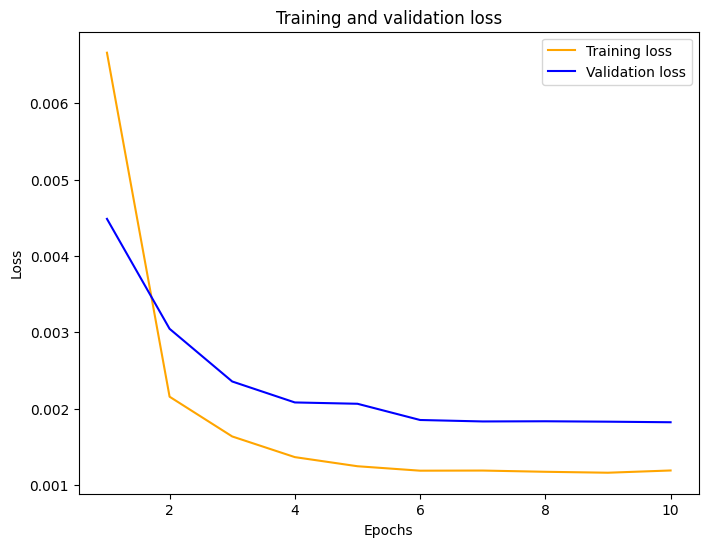

In [86]:
plot_curve(hist_1)

In [87]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

10/10 [==============================] - 1s 7ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-16 09:10:00,0.111,0.324725,0.330802
1,2021-12-16 09:11:00,0.112,0.145903,0.133800
2,2021-12-16 09:12:00,0.116,0.120067,0.117222
3,2021-12-16 09:13:00,0.112,0.119231,0.117484
4,2021-12-16 09:14:00,0.099,0.115862,0.114156
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.166643,0.171506
289,2021-12-16 13:59:00,0.169,0.166334,0.171325
290,2021-12-16 14:00:00,0.147,0.167044,0.172211
291,2021-12-16 14:01:00,0.145,0.149797,0.153018


In [88]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [89]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
lstm_rmse_error8 = mean_squared_error(test3["cloud_cover"], test3["LSTM_100"], squared=False)
lstm_mae_error8 = mae(test3["cloud_cover"], test3["LSTM_100"])
lstm_mape_error8 = mape(test3['cloud_cover'], test3['LSTM_100'])
error(lstm_mse_error_unit_100,lstm_rmse_error8,lstm_mae_error8,lstm_mape_error8)

[{'MSE': 0.0018128343104255088,
  'RMSE': 0.04257739201061414,
  'MAE': 0.011594477652689703,
  'MAPE': 0.05598332166894623}]

In [90]:
compare_model(lstm_mape_error,lstm_mape_error8)

Better MSE value is :  0.05598332166894623


,Model,MSE error
0,model,0.056204
1,model_1,0.055983


In [141]:
data7 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 100, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error8, 'MAPE error' : lstm_mape_error8,'MSE error':lstm_mse_error_unit_100, 'RMSE error':lstm_rmse_error8}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\4247367534.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,,50,,,,,1,10,0.012514,0.056939,0.001816,0.042613
2,25,Adam,64,,50,,,,,1,10,0.013487,0.060221,0.001930,0.043927
3,25,Adam,32,0.1,50,,,,,1,10,0.020206,0.113982,0.002136,0.046219
4,25,Adam,32,0.05,50,,,,,1,10,0.020668,0.114666,0.002190,0.046794
5,25,Adam,32,0.01,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933
6,25,Adam,32,0.005,50,,,,,1,10,0.013141,0.064064,0.001844,0.042937
7,25,Adam,32,0.001,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933
8,25,Adam,32,,100,,,,,1,10,0.011594,0.055983,0.001813,0.042577


------------

### Add frist layer: units = 100 and Add Dropout = 0.1

In [92]:
model_2 = Sequential()
model_2.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
model_2.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 17s 22ms/step - loss: 0.0108 - val_loss: 0.0054
Epoch 2/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0031 - val_loss: 0.0037
Epoch 3/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0024 - val_loss: 0.0028
Epoch 4/10
461/461 [==============================] - 8s 18ms/step - loss: 0.0020 - val_loss: 0.0023
Epoch 5/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 6/10
461/461 [==============================] - 8s 18ms/step - loss: 0.0018 - val_loss: 0.0020
Epoch 7/10
461/461 [==============================] - 8s 18ms/step - loss: 0.0017 - val_loss: 0.0019
Epoch 8/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0016 - val_loss: 0.0019
Epoch 9/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0015 - val_loss: 0.0018
Epoch 10/10
461/461 [==============================] - 8s 18ms/step - loss: 0.0015 - val_l

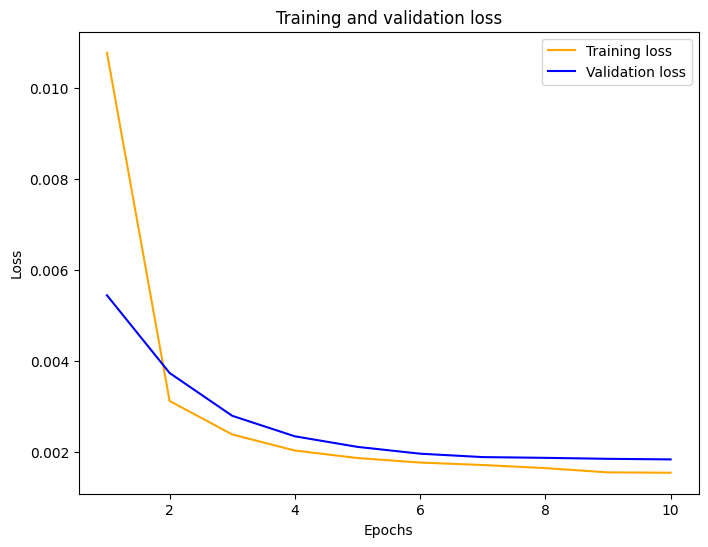

In [93]:
plot_curve(hist_2)

In [94]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

10/10 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-16 09:10:00,0.111,0.324725,0.330802,0.332823
1,2021-12-16 09:11:00,0.112,0.145903,0.133800,0.150703
2,2021-12-16 09:12:00,0.116,0.120067,0.117222,0.111655
3,2021-12-16 09:13:00,0.112,0.119231,0.117484,0.111995
4,2021-12-16 09:14:00,0.099,0.115862,0.114156,0.113817
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.166643,0.171506,0.173478
289,2021-12-16 13:59:00,0.169,0.166334,0.171325,0.173047
290,2021-12-16 14:00:00,0.147,0.167044,0.172211,0.173751
291,2021-12-16 14:01:00,0.145,0.149797,0.153018,0.157172


In [95]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [96]:
lstm_mse_error_100_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
lstm_rmse_error9 = mean_squared_error(test3["cloud_cover"], test3["LSTM_Drop_out"], squared=False)
lstm_mae_error9 = mae(test3["cloud_cover"], test3["LSTM_Drop_out"])
lstm_mape_error9 = mape(test3['cloud_cover'], test3['LSTM_Drop_out'])
error(lstm_mse_error_100_drop_out,lstm_rmse_error9,lstm_mae_error9,lstm_mape_error9)

[{'MSE': 0.001824987719994061,
  'RMSE': 0.04271987499974761,
  'MAE': 0.013065759531263602,
  'MAPE': 0.0631784763778053}]

In [97]:
compare_model(lstm_mape_error8,lstm_mape_error9)

Better MSE value is :  0.05598332166894623


,Model,MSE error
0,model,0.055983
1,model_1,0.063178


In [142]:
data8 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 100, 'Drop out':0.1, 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error9, 'MAPE error' : lstm_mape_error9,'MSE error':lstm_mse_error_100_drop_out, 'RMSE error':lstm_rmse_error9}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\2102744798.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,,50,,,,,1,10,0.012514,0.056939,0.001816,0.042613
2,25,Adam,64,,50,,,,,1,10,0.013487,0.060221,0.001930,0.043927
3,25,Adam,32,0.1,50,,,,,1,10,0.020206,0.113982,0.002136,0.046219
4,25,Adam,32,0.05,50,,,,,1,10,0.020668,0.114666,0.002190,0.046794
5,25,Adam,32,0.01,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933
6,25,Adam,32,0.005,50,,,,,1,10,0.013141,0.064064,0.001844,0.042937
7,25,Adam,32,0.001,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933
8,25,Adam,32,,100,,,,,1,10,0.011594,0.055983,0.001813,0.042577
9,25,Adam,32,,100,0.1,,,,1,10,0.013066,0.063178,0.001825,0.042720


------------------------------------

### Add frist layer: units = 100 and Add second layer: unit = 50

In [99]:
model_3 = Sequential()
model_3.add(LSTM(units = 100, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
model_3.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 26s 32ms/step - loss: 0.0071 - val_loss: 0.0048
Epoch 2/10
461/461 [==============================] - 13s 27ms/step - loss: 0.0023 - val_loss: 0.0033
Epoch 3/10
461/461 [==============================] - 13s 28ms/step - loss: 0.0017 - val_loss: 0.0022
Epoch 4/10
461/461 [==============================] - 13s 28ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 5/10
461/461 [==============================] - 13s 28ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 6/10
461/461 [==============================] - 13s 28ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 7/10
461/461 [==============================] - 14s 30ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 8/10
461/461 [==============================] - 14s 30ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 9/10
461/461 [==============================] - 15s 33ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 10/10
461/461 [==============================] - 17s 36ms/step - loss: 0.001

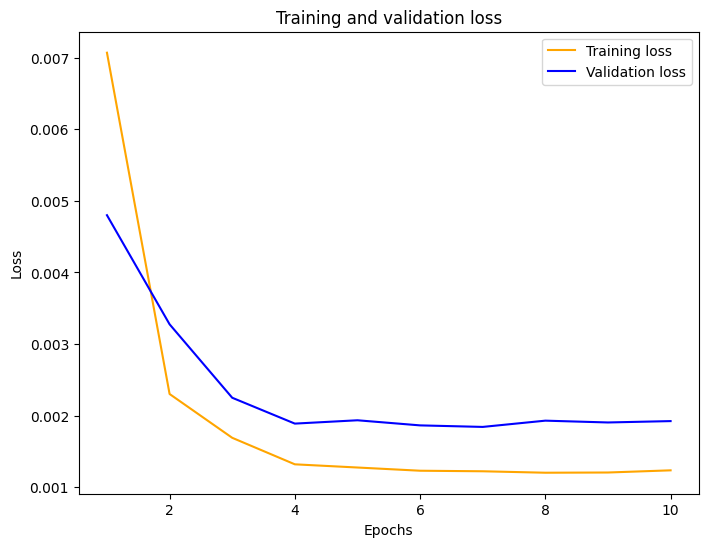

In [100]:
plot_curve(hist_3)

In [101]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

10/10 [==============================] - 1s 18ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-16 09:10:00,0.111,0.324725,0.330802,0.332823,0.317845
1,2021-12-16 09:11:00,0.112,0.145903,0.133800,0.150703,0.140357
2,2021-12-16 09:12:00,0.116,0.120067,0.117222,0.111655,0.109269
3,2021-12-16 09:13:00,0.112,0.119231,0.117484,0.111995,0.106766
4,2021-12-16 09:14:00,0.099,0.115862,0.114156,0.113817,0.104770
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.166643,0.171506,0.173478,0.158736
289,2021-12-16 13:59:00,0.169,0.166334,0.171325,0.173047,0.158422
290,2021-12-16 14:00:00,0.147,0.167044,0.172211,0.173751,0.159136
291,2021-12-16 14:01:00,0.145,0.149797,0.153018,0.157172,0.142222


In [102]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [103]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
lstm_rmse_error11 = mean_squared_error(test3["cloud_cover"], test3["LSTM_second_layer_50"], squared=False)
lstm_mae_error11 = mae(test3["cloud_cover"], test3["LSTM_second_layer_50"])
lstm_mape_error11 = mape(test3['cloud_cover'], test3['LSTM_second_layer_50'])
error(lstm_mse_error_second_layer,lstm_rmse_error11,lstm_mae_error11,lstm_mape_error11)


[{'MSE': 0.0019121760008141316,
  'RMSE': 0.043728434694305394,
  'MAE': 0.0171535547693028,
  'MAPE': 0.08302389934679354}]

In [104]:
compare_model(lstm_mape_error8,lstm_mape_error11)

Better MSE value is :  0.05598332166894623


,Model,MSE error
0,model,0.055983
1,model_1,0.083024


In [143]:
data10 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 100, 'Drop out':'', 'Second layer':50, 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error11, 'MAPE error' : lstm_mape_error11,'MSE error':lstm_mse_error_second_layer, 'RMSE error':lstm_rmse_error11}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\1460661806.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,,50,,,,,1,10,0.012514,0.056939,0.001816,0.042613
2,25,Adam,64,,50,,,,,1,10,0.013487,0.060221,0.001930,0.043927
3,25,Adam,32,0.1,50,,,,,1,10,0.020206,0.113982,0.002136,0.046219
4,25,Adam,32,0.05,50,,,,,1,10,0.020668,0.114666,0.002190,0.046794
5,25,Adam,32,0.01,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933
6,25,Adam,32,0.005,50,,,,,1,10,0.013141,0.064064,0.001844,0.042937
7,25,Adam,32,0.001,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933
8,25,Adam,32,,100,,,,,1,10,0.011594,0.055983,0.001813,0.042577
9,25,Adam,32,,100,0.1,,,,1,10,0.013066,0.063178,0.001825,0.042720


---

### Add frist layer: units = 100 and change epochs from 10 to 20

In [106]:
model_5 = Sequential()
model_5.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
model_5.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
461/461 [==============================] - 13s 19ms/step - loss: 0.0065 - val_loss: 0.0049
Epoch 2/20
461/461 [==============================] - 8s 17ms/step - loss: 0.0024 - val_loss: 0.0037
Epoch 3/20
461/461 [==============================] - 11s 23ms/step - loss: 0.0019 - val_loss: 0.0030
Epoch 4/20
461/461 [==============================] - 7s 15ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 5/20
461/461 [==============================] - 8s 16ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 6/20
461/461 [==============================] - 9s 20ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 7/20
461/461 [==============================] - 10s 22ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 8/20
461/461 [==============================] - 9s 20ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 9/20
461/461 [==============================] - 11s 24ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 10/20
461/461 [==============================] - 8s 17ms/step - loss: 0.0012 - va

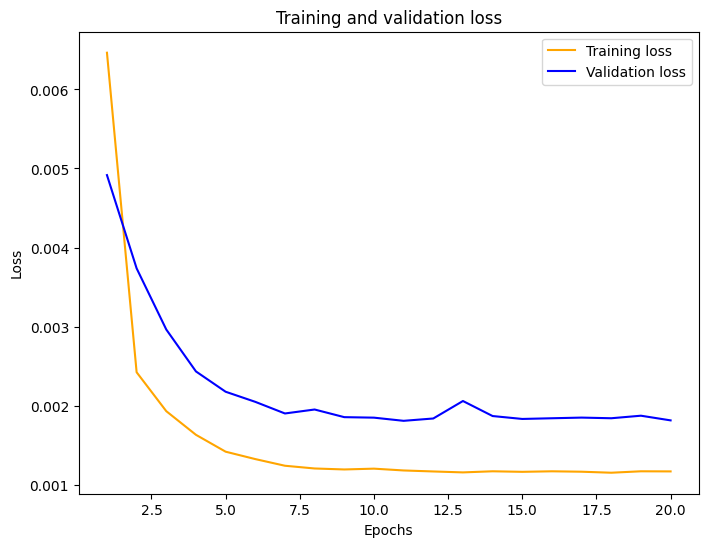

In [107]:
plot_curve(hist_5)

In [108]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

10/10 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20
0,2021-12-16 09:10:00,0.111,0.324725,0.330802,0.332823,0.317845,0.324756
1,2021-12-16 09:11:00,0.112,0.145903,0.133800,0.150703,0.140357,0.127167
2,2021-12-16 09:12:00,0.116,0.120067,0.117222,0.111655,0.109269,0.126599
3,2021-12-16 09:13:00,0.112,0.119231,0.117484,0.111995,0.106766,0.125351
4,2021-12-16 09:14:00,0.099,0.115862,0.114156,0.113817,0.104770,0.119279
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.166643,0.171506,0.173478,0.158736,0.169595
289,2021-12-16 13:59:00,0.169,0.166334,0.171325,0.173047,0.158422,0.169573
290,2021-12-16 14:00:00,0.147,0.167044,0.172211,0.173751,0.159136,0.170420
291,2021-12-16 14:01:00,0.145,0.149797,0.153018,0.157172,0.142222,0.150164


In [109]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [110]:
lstm_mse_error_unit_50_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
lstm_rmse_error12 = mean_squared_error(test3["cloud_cover"], test3["LSTM_epoch20"], squared=False)
lstm_mae_error12 = mae(test3["cloud_cover"], test3["LSTM_epoch20"])
lstm_mape_error12 = mape(test3['cloud_cover'], test3['LSTM_epoch20'])
error(lstm_mse_error_unit_50_epoch20,lstm_rmse_error12,lstm_mae_error12,lstm_mape_error12)

[{'MSE': 0.0018049147234626237,
  'RMSE': 0.042484287959934364,
  'MAE': 0.011638053995960808,
  'MAPE': 0.05414120882069105}]

In [111]:
compare_model(lstm_mape_error8,lstm_mape_error12)

Better MSE value is :  0.05414120882069105


,Model,MSE error
0,model,0.055983
1,model_1,0.054141


In [144]:
data11 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 100, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':20 , 'MAE error':lstm_mae_error12, 'MAPE error' : lstm_mape_error12,'MSE error':lstm_mse_error_unit_50_epoch20, 'RMSE error':lstm_rmse_error12}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\3656997716.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,,50,,,,,1,10,0.012514,0.056939,0.001816,0.042613
2,25,Adam,64,,50,,,,,1,10,0.013487,0.060221,0.001930,0.043927
3,25,Adam,32,0.1,50,,,,,1,10,0.020206,0.113982,0.002136,0.046219
4,25,Adam,32,0.05,50,,,,,1,10,0.020668,0.114666,0.002190,0.046794
5,25,Adam,32,0.01,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933
6,25,Adam,32,0.005,50,,,,,1,10,0.013141,0.064064,0.001844,0.042937
7,25,Adam,32,0.001,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933
8,25,Adam,32,,100,,,,,1,10,0.011594,0.055983,0.001813,0.042577
9,25,Adam,32,,100,0.1,,,,1,10,0.013066,0.063178,0.001825,0.042720


---

### Add frist layer: units = 100 and change epochs from 20 to 30

In [127]:
model_4 = Sequential()
model_4.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_4.add(Dense(units = 1))
model_4.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_4 = model_4.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 30, batch_size = 32)

Epoch 1/30
461/461 [==============================] - 13s 19ms/step - loss: 0.0064 - val_loss: 0.0046
Epoch 2/30
461/461 [==============================] - 9s 19ms/step - loss: 0.0022 - val_loss: 0.0033
Epoch 3/30
461/461 [==============================] - 8s 18ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 4/30
461/461 [==============================] - 8s 18ms/step - loss: 0.0015 - val_loss: 0.0022
Epoch 5/30
461/461 [==============================] - 9s 19ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 6/30
461/461 [==============================] - 10s 22ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 7/30
461/461 [==============================] - 7s 16ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 8/30
461/461 [==============================] - 7s 16ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 9/30
461/461 [==============================] - 8s 17ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 10/30
461/461 [==============================] - 8s 17ms/step - loss: 0.0012 - val_

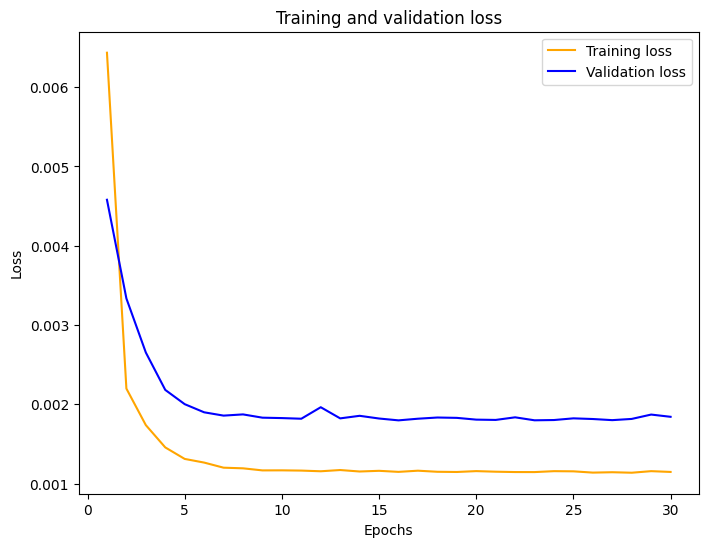

In [128]:
plot_curve(hist_4)

In [129]:
predict_scaled_4 = model_4.predict(X_test)
predict_4 = sc.inverse_transform(predict_scaled_4)
test3['LSTM_epoch30'] = predict_4
test3

10/10 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20,LSTM_epoch30,LSTM_epoch40
0,2021-12-16 09:10:00,0.111,0.324725,0.330802,0.332823,0.317845,0.324756,0.317710,0.326245
1,2021-12-16 09:11:00,0.112,0.145903,0.133800,0.150703,0.140357,0.127167,0.120499,0.127703
2,2021-12-16 09:12:00,0.116,0.120067,0.117222,0.111655,0.109269,0.126599,0.128626,0.123372
3,2021-12-16 09:13:00,0.112,0.119231,0.117484,0.111995,0.106766,0.125351,0.122692,0.117394
4,2021-12-16 09:14:00,0.099,0.115862,0.114156,0.113817,0.104770,0.119279,0.115449,0.119949
...,...,...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.166643,0.171506,0.173478,0.158736,0.169595,0.163962,0.168966
289,2021-12-16 13:59:00,0.169,0.166334,0.171325,0.173047,0.158422,0.169573,0.164085,0.168878
290,2021-12-16 14:00:00,0.147,0.167044,0.172211,0.173751,0.159136,0.170420,0.164883,0.169604
291,2021-12-16 14:01:00,0.145,0.149797,0.153018,0.157172,0.142222,0.150164,0.144322,0.149179


In [130]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch30'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [131]:
lstm_mse_error_unit_50_epoch30 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch30'], squared=True)
lstm_rmse_error10 = mean_squared_error(test3["cloud_cover"], test3["LSTM_epoch30"], squared=False)
lstm_mae_error10 = mae(test3["cloud_cover"], test3["LSTM_epoch30"])
lstm_mape_error10 = mape(test3['cloud_cover'], test3['LSTM_epoch30'])
error(lstm_mse_error_unit_50_epoch30,lstm_rmse_error10,lstm_mae_error10,lstm_mape_error10)

[{'MSE': 0.0018336220236286067,
  'RMSE': 0.04282081297253249,
  'MAE': 0.012958045845552518,
  'MAPE': 0.05974837143559454}]

In [132]:
compare_model(lstm_mape_error12,lstm_mape_error10)

Better MSE value is :  0.05414120882069105


,Model,MSE error
0,model,0.054141
1,model_1,0.059748


In [145]:
data11 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 100, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':30 , 'MAE error':lstm_mae_error10, 'MAPE error' : lstm_mape_error10,'MSE error':lstm_mse_error_unit_50_epoch30, 'RMSE error':lstm_rmse_error10}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_17988\4024801785.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,,50,,,,,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,,50,,,,,1,10,0.012514,0.056939,0.001816,0.042613
2,25,Adam,64,,50,,,,,1,10,0.013487,0.060221,0.001930,0.043927
3,25,Adam,32,0.1,50,,,,,1,10,0.020206,0.113982,0.002136,0.046219
4,25,Adam,32,0.05,50,,,,,1,10,0.020668,0.114666,0.002190,0.046794
5,25,Adam,32,0.01,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933
6,25,Adam,32,0.005,50,,,,,1,10,0.013141,0.064064,0.001844,0.042937
7,25,Adam,32,0.001,50,,,,,1,10,0.012911,0.062051,0.001843,0.042933
8,25,Adam,32,,100,,,,,1,10,0.011594,0.055983,0.001813,0.042577
9,25,Adam,32,,100,0.1,,,,1,10,0.013066,0.063178,0.001825,0.042720


---

# save model

In [146]:
mse_data = mse_data.round({"MSE error": 6, "MAE error": 6, "MAPE error": 6, "RMSE error": 6})

In [147]:
mse_data.to_csv('data_last_day_lag25.csv',index=False)

In [148]:
lstm = pd.read_csv('data_last_day_lag25.csv')

In [149]:
lstm

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,25,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.012478,0.056204,0.001835,0.042836
1,25,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.012514,0.056939,0.001816,0.042613
2,25,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.013487,0.060221,0.001930,0.043927
3,25,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.020206,0.113982,0.002136,0.046219
4,25,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.020668,0.114666,0.002190,0.046794
5,25,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.012911,0.062051,0.001843,0.042933
6,25,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.013141,0.064064,0.001844,0.042937
7,25,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.012911,0.062051,0.001843,0.042933
8,25,Adam,32,NaN,100,NaN,NaN,NaN,NaN,1,10,0.011594,0.055983,0.001813,0.042577
9,25,Adam,32,NaN,100,0.1,NaN,NaN,NaN,1,10,0.013066,0.063178,0.001825,0.042720


# error

In [150]:
error = lstm.groupby(['Lags'])[['MAE error','MAPE error','MSE error','RMSE error']].transform(min) == lstm[['MAE error','MAPE error','MSE error','RMSE error']]
lstm[error]

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.011594,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [151]:
model_5.save('model_last_day_lag25.h5')